<a href="https://colab.research.google.com/github/nakitava/image_processing/blob/main/%D0%9A%D0%BE%D0%BF%D0%B8%D1%8F_%D0%B1%D0%BB%D0%BE%D0%BA%D0%BD%D0%BE%D1%82%D0%B0_%22%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%961_%D0%9E%D1%81%D0%BD%D0%BE%D0%B2%D0%BD%D1%8B%D0%B5_%D0%BC%D0%B5%D1%82%D0%BE%D0%B4%D1%8B_OpenCV_%D0%A7%D0%B0%D1%81%D1%82%D1%8C_%E2%84%961_ipynb%22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа №1. Основные методы OpenCV. Часть №1**

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

---

# **Тема №1. Чтение, запись и отображение**



## **Задание 1:**  
Напишите процедуру, которая:

- Считывает цветное изображение в режиме `cv2.IMREAD_COLOR`.
- Преобразует его в оттенки серого с использованием `cv2.cvtColor()`.
- Сохраняет полученное черно-белое изображение на диск.
- Отображает оба изображения (оригинальное цветное и преобразованное черно-белое).




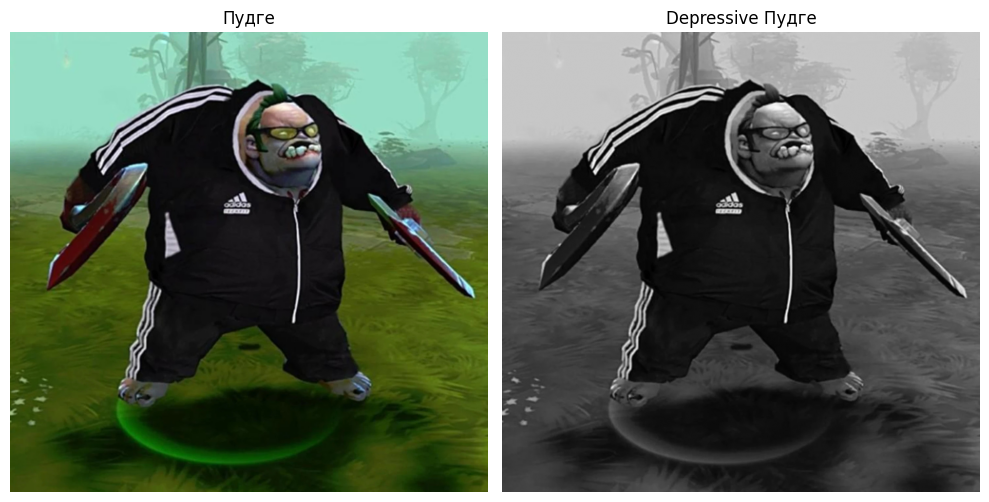

In [ ]:
img_color = cv.imread('pudge.jpg', cv.IMREAD_COLOR)
img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)
cv.imwrite('grey_pudge.jpg', img_gray)

plt.figure(figsize = (10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
plt.title('Пудге')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap = 'gray')
plt.title('Depressive Пудге')
plt.axis('off')
plt.tight_layout()
plt.show()

## **Задание 2:**  
Используя режим `cv2.IMREAD_UNCHANGED`, загрузите изображение с альфа-каналом (например, PNG с прозрачностью). Затем:

- Разделите изображение на каналы (B, G, R, A).
- Создайте новое изображение, где прозрачность (альфа-канал) инвертирована (т.е. прозрачные области становятся непрозрачными и наоборот).
- Сохраните и отобразите полученное изображение.

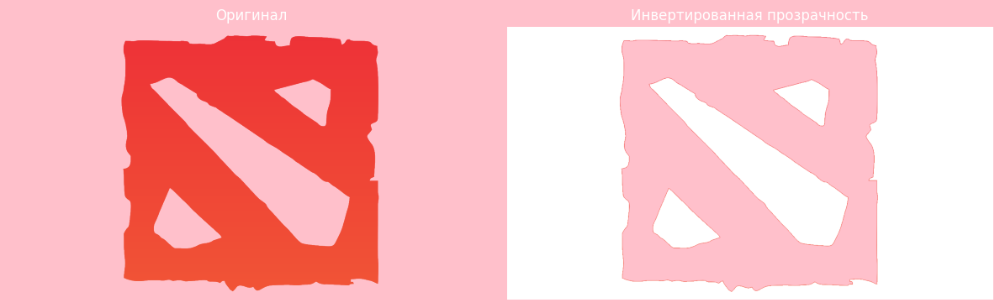

In [ ]:
img = cv.imread('dota_logo.png', cv.IMREAD_UNCHANGED)

b, g, r, a = cv.split(img)

a_inv = cv.bitwise_not(a)
img_inv = cv.merge((b, g, r, a_inv))
cv.imwrite('inverted_dota.png', img_inv)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
fig.patch.set_facecolor('pink')

ax1.imshow(cv.cvtColor(img, cv.COLOR_BGRA2RGBA))
ax1.set_title('Красный квадрат малевича', color='white')
ax1.axis('off')

ax2.imshow(cv.cvtColor(img_inv, cv.COLOR_BGRA2RGBA))
ax2.set_title('Прозрачный квадрат малевича', color='white')
ax2.axis('off')

plt.tight_layout()
plt.show()


---

# **Тема №2. Работа с цветовыми палитрами**



## **Задание 3:**  
Напишите процедуру, которая:

- Считывает цветное изображение.
- Преобразует его из цветового пространства BGR в HSV с помощью `cv2.cvtColor()`.
- Увеличивает насыщенность (канал S) в 1.5 раза, не превышая максимального значения.
- Преобразует изображение обратно в цветовое пространство BGR.
- Отображает оригинальное и полученное изображения рядом для сравнения.

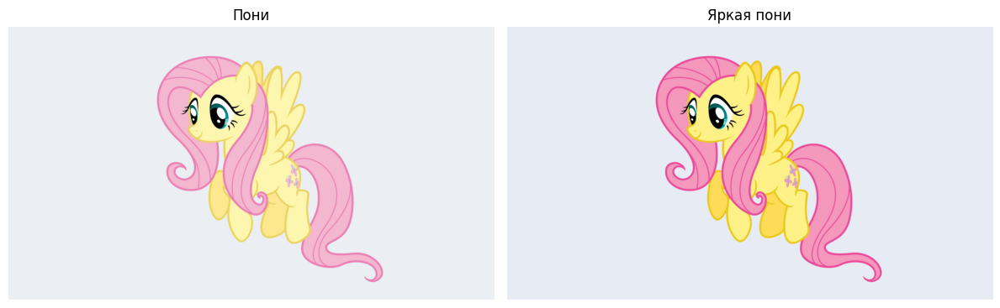

In [ ]:
img = cv.imread('horse.png', cv.IMREAD_COLOR)
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
hsv[:, :, 1] = np.clip(hsv[:, :, 1].astype(np.float32) * 1.5, 0, 255).astype(np.uint8)
img_sat = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Пони')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_sat, cv.COLOR_BGR2RGB))
plt.title('Яркая пони')
plt.axis('off')

plt.tight_layout()
plt.show()

## **Задание 4:**  
Напишите процедуру, которая:

- Считывает изображение и Преобразует его в цветовое пространство YCrCb.
- Применяет размытие к компоненте яркости Y (при помощи фильтра, см. материал предыдущих занятий).
- Снова Преобразует изображение в цветовое пространство BGR.
- Отображает исходное и размытое изображения.

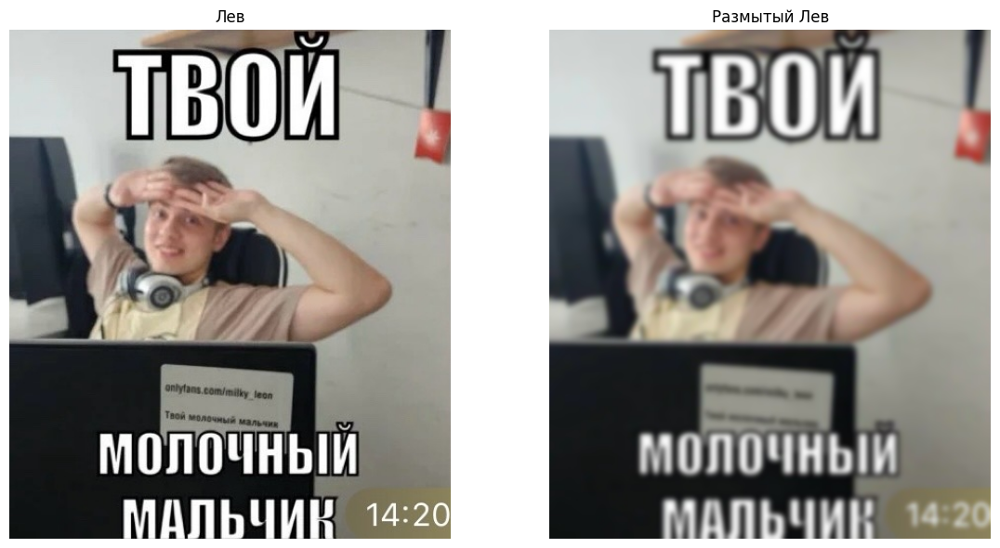

In [ ]:
img = cv.imread('lev.jpg', cv.IMREAD_COLOR)
ycrcb = cv.cvtColor(img, cv.COLOR_BGR2YCrCb)
y, cr, cb = cv.split(ycrcb)
y_blur = cv.GaussianBlur(y, (15, 15), 0)
ycrcb_blur = cv.merge((y_blur, cr, cb))
lev_blur = cv.cvtColor(ycrcb_blur, cv.COLOR_YCrCb2BGR)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Лев')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(lev_blur, cv.COLOR_BGR2RGB))
plt.title('Размытый Лев')
plt.axis('off')
plt.tight_layout()
plt.show()

---

# **Тема №3. Слияние и усиление**

## **Задание 5:**  
Создайте процедуру, которая:

- Считывает два изображения одинакового размера (можно подкорректировать с помощью метода `.resize()`).
- Выполняет побитовое ИЛИ (OR) над соответствующими пикселями двух изображений.
- Сохраняет и отображает результат операции.

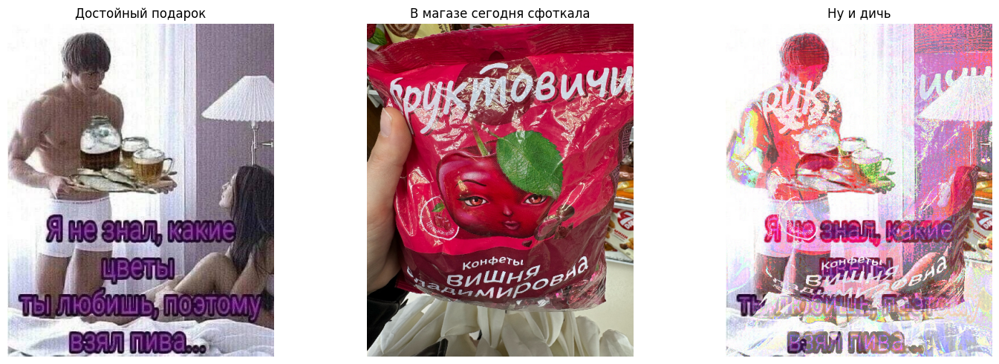

In [ ]:
img1 = cv.imread('beer.jpg', cv.IMREAD_COLOR)
img2 = cv.imread('cherry_lady.jpg', cv.IMREAD_COLOR)

h, w = img1.shape[:2]
img2_res = cv.resize(img2, (w, h))
result = cv.bitwise_or(img1, img2_res)
cv.imwrite('lol.jpg', result)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
plt.title('Достойный подарок')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img2_res, cv.COLOR_BGR2RGB))
plt.title('В магазе сегодня сфоткала')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Ну и дичь')
plt.axis('off')
plt.tight_layout()
plt.show()

## **Задание 6:**  
Реализуйте следующий алгоритм:

- Считайте цветное изображение и разделите его на три канала с использованием `.split()`.
- Примените к каждому каналу разный коэффициент гамма-коррекции (например, для R – 0.5, G – 1.0, B – 1.5).
- Объедините каналы обратно с помощью `.merge()`.
- Отобразите исходное и обработанное изображения.


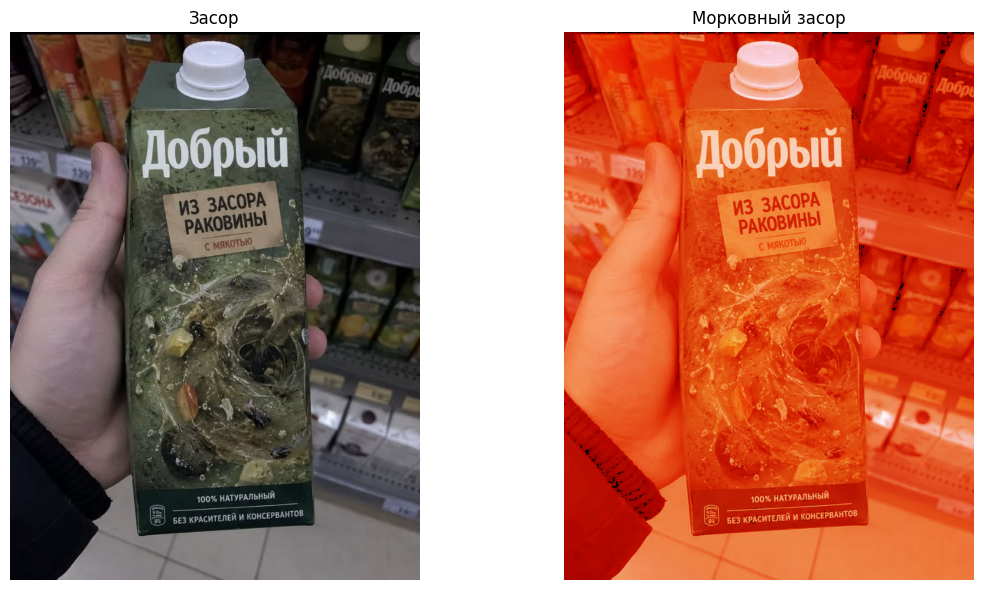

In [6]:
img = cv.imread('juice.jpg', cv.IMREAD_COLOR)
b, g, r = cv.split(img)

def gamma_corr(ch, gamma):
    table = np.array([((i / 255.0) ** gamma) * 255 for i in range(256)]).astype(np.uint8)
    return cv.LUT(ch, table)

r_g = gamma_corr(r, 0.1)
g_g = gamma_corr(g, 1.0)
b_g = gamma_corr(b, 1.9)
img_gamma = cv.merge((b_g, g_g, r_g))

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Засор')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_gamma, cv.COLOR_BGR2RGB))
plt.title('Морковный засор')
plt.axis('off')
plt.tight_layout()
plt.show()

---

# **Тема №4. Работа с гистограммами в OpenCV**

## **Задание 7:**  
Напишите процедуру для улучшения контрастности изображения:

- Считывает изображение в оттенках серого.
- Строит его гистограмму с использованием `cv.calcHist()`.
- Применяет эквализацию гистограммы методом `cv2.equalizeHist()`.
- Отображает на одном графике исходное и эквализованное изображения вместе с их гистограммами.

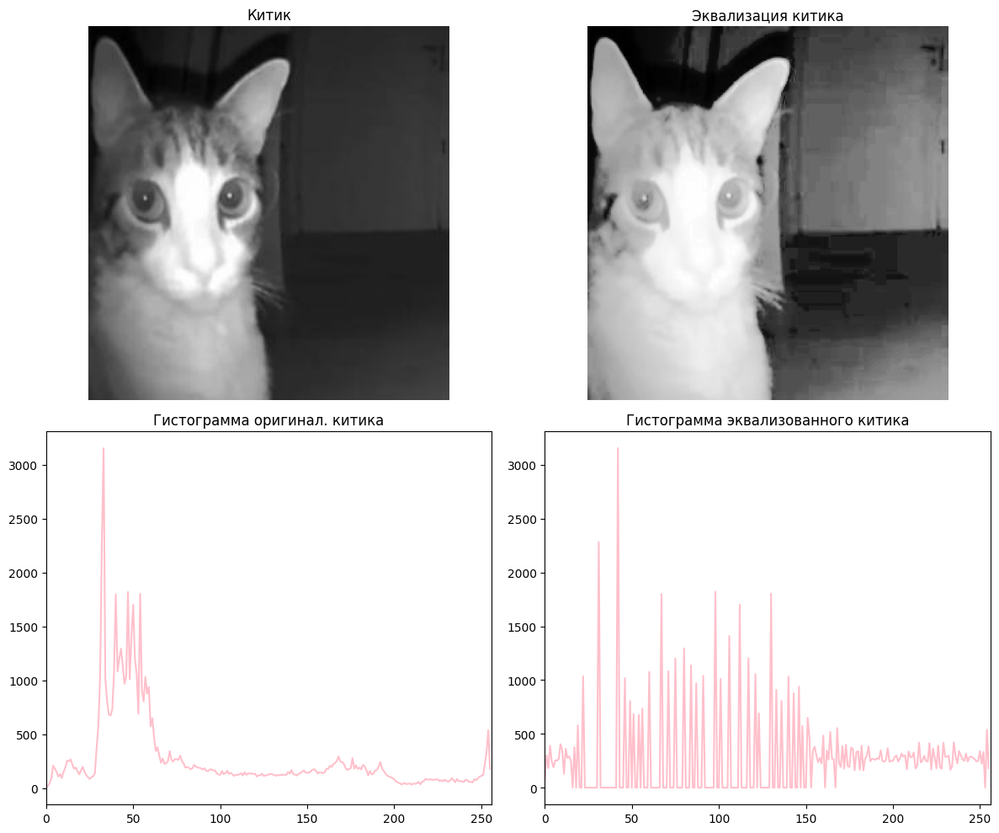

In [8]:
img = cv.imread('cat.jpg', cv.IMREAD_COLOR)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_eq = cv.equalizeHist(gray)

hist_orig = cv.calcHist([gray], [0], None, [256], [0, 256])
hist_eq = cv.calcHist([gray_eq], [0], None, [256], [0, 256])

plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('Китик')
plt.axis('off')
plt.subplot(2, 2, 2)
plt.imshow(gray_eq, cmap='gray')
plt.title('Эквализация китика')
plt.axis('off')
plt.subplot(2, 2, 3)
plt.plot(hist_orig, color='pink')
plt.title('Гистограмма оригинал. китика')
plt.xlim([0, 256])
plt.subplot(2, 2, 4)
plt.plot(hist_eq, color='pink')
plt.title('Гистограмма эквализованного китика')
plt.xlim([0, 256])
plt.tight_layout()
plt.show()

## **Задание 8:**  
Используйте метод CLAHE для улучшения деталей в затемненных областях цветного изображения:

- Преобразуйте изображение из BGR в LAB цветовое пространство.
- Разделите изображение на каналы и примените `cv2.createCLAHE()` к каналу яркости L.
- Объедините обработанный канал L с исходными каналами A и B.
- Преобразуйте изображение обратно в BGR.
- Отобразите исходное и обработанное изображения для сравнения вместе с их гистограммами.

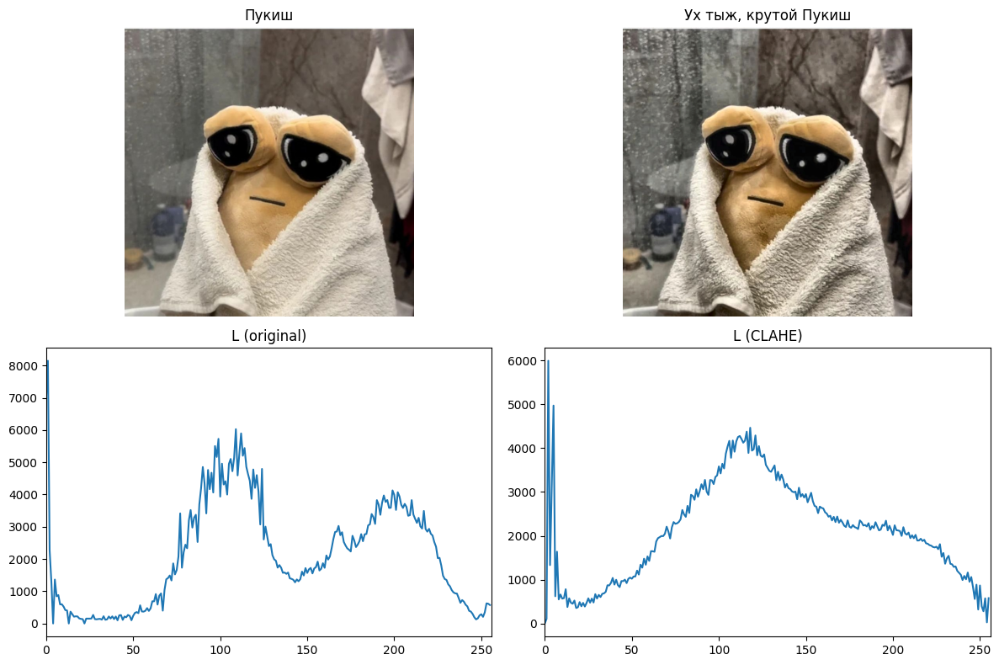

In [15]:
img = cv.imread('pou.jpg', cv.IMREAD_COLOR)
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
L, A, B = cv.split(lab)

clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
L_clahe = clahe.apply(L)

lab_clahe = cv.merge([L_clahe, A, B])
img_clahe = cv.cvtColor(lab_clahe, cv.COLOR_LAB2BGR)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axes[0, 0].set_title('Пукиш')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv.cvtColor(img_clahe, cv.COLOR_BGR2RGB))
axes[0, 1].set_title('Ух тыж, крутой Пукиш')
axes[0, 1].axis('off')

for ax, ch, title in zip(axes[1], [L, L_clahe], ['L (original)', 'L (CLAHE)']):
    hist = cv.calcHist([ch], [0], None, [256], [0, 256])
    ax.plot(hist)
    ax.set_title(title)
    ax.set_xlim([0, 256])

plt.tight_layout()
plt.show()

## **Затем:**  
Исследуйте влияние размера окна (tileGridSize) и порога по сравнению с гистограммой (clipLimit) в методе CLAHE на конечный результат. Попробуйте несколько различных значений и визуализируйте результаты.


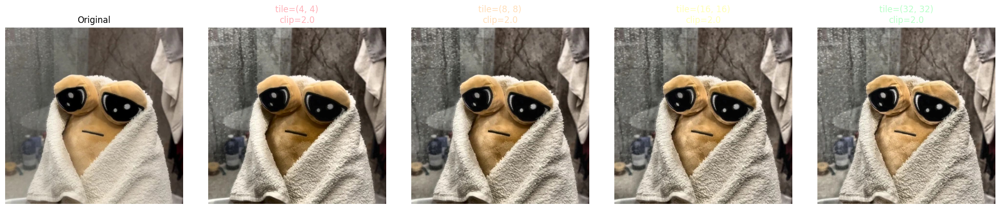

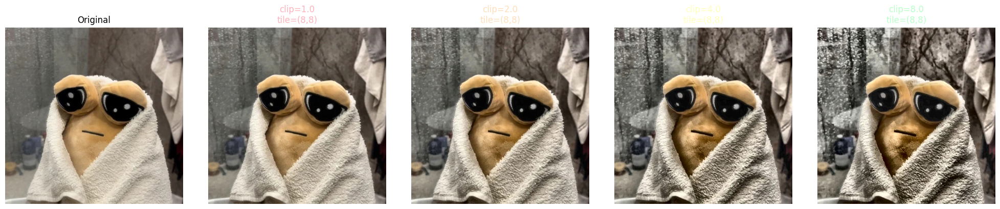

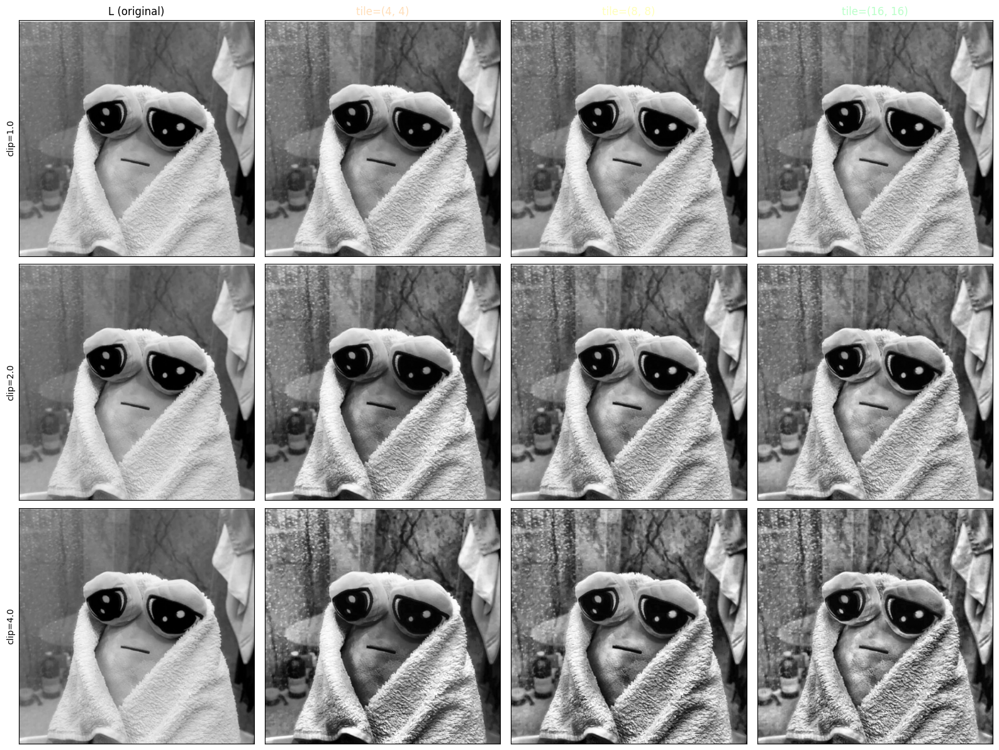

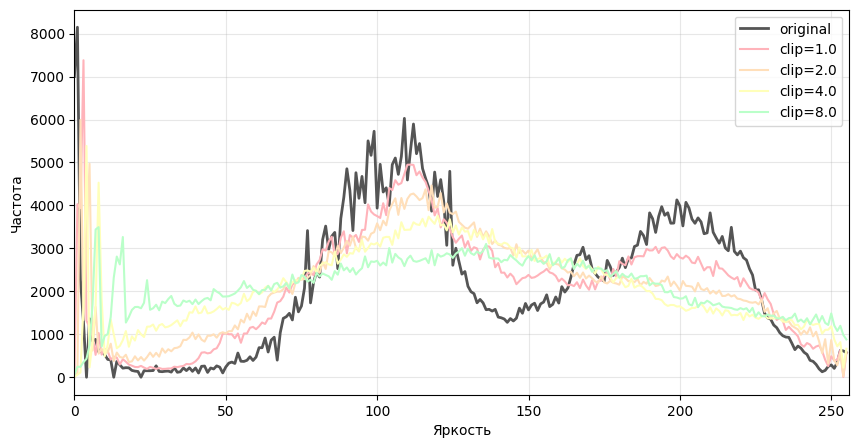

  clip     tile      std    entropy
------------------------------------
     -        -    58.38     7.5328  (original)
   1.0   (4, 4)    61.03     7.7694
   1.0   (8, 8)    58.61     7.7067
   1.0 (16, 16)    57.02     7.6289
   2.0   (4, 4)    62.28     7.8486
   2.0   (8, 8)    58.83     7.7786
   2.0 (16, 16)    56.10     7.6842
   4.0   (4, 4)    65.67     7.9238
   4.0   (8, 8)    61.19     7.8599
   4.0 (16, 16)    56.95     7.7719


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

img = cv.imread('pou.jpg', cv.IMREAD_COLOR)
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
L, A, B = cv.split(lab)

pastel = ['#FFB3BA', '#FFDFBA', '#FFFFBA', '#BAFFC9', '#BAE1FF', '#C9BAFF', '#FFBAED']

def to_rgb(im):
    return cv.cvtColor(im, cv.COLOR_BGR2RGB)

def clahe_img(clip, tile):
    c = cv.createCLAHE(clipLimit=clip, tileGridSize=tile).apply(L)
    return cv.cvtColor(cv.merge([c, A, B]), cv.COLOR_LAB2BGR)

def show_row(images, titles, colors):
    fig, axes = plt.subplots(1, len(images), figsize=(4 * len(images), 4))
    if len(images) == 1:
        axes = [axes]
    for ax, im, t, col in zip(axes, images, titles, colors):
        ax.imshow(to_rgb(im) if im.ndim == 3 else im, cmap=None if im.ndim == 3 else 'gray',
                  vmin=None if im.ndim == 3 else 0, vmax=None if im.ndim == 3 else 255)
        ax.set_title(t, color=col)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

tiles = [(4, 4), (8, 8), (16, 16), (32, 32)]
imgs = [img] + [clahe_img(2.0, t) for t in tiles]
titles = ['Original'] + [f'tile={t}\nclip=2.0' for t in tiles]
colors = ['black'] + pastel[:len(tiles)]
show_row(imgs, titles, colors)

clips = [1.0, 2.0, 4.0, 8.0]
imgs = [img] + [clahe_img(c, (8, 8)) for c in clips]
titles = ['Original'] + [f'clip={c}\ntile=(8,8)' for c in clips]
colors = ['black'] + pastel[:len(clips)]
show_row(imgs, titles, colors)

clips = [1.0, 2.0, 4.0]
tiles = [(4, 4), (8, 8), (16, 16)]
fig, axes = plt.subplots(len(clips), len(tiles) + 1,
                         figsize=(4 * (len(tiles) + 1), 4 * len(clips)))
for i, clip in enumerate(clips):
    axes[i, 0].imshow(L, cmap='gray', vmin=0, vmax=255)
    axes[i, 0].set_ylabel(f'clip={clip}')
    if i == 0:
        axes[i, 0].set_title('L (original)')
    axes[i, 0].set_xticks([]); axes[i, 0].set_yticks([])
    for j, tile in enumerate(tiles):
        Lc = cv.createCLAHE(clipLimit=clip, tileGridSize=tile).apply(L)
        axes[i, j + 1].imshow(Lc, cmap='gray', vmin=0, vmax=255)
        if i == 0:
            axes[i, j + 1].set_title(f'tile={tile}', color=pastel[(j + 1) % len(pastel)])
        axes[i, j + 1].set_xticks([]); axes[i, j + 1].set_yticks([])
plt.tight_layout()
plt.show()

clips = [1.0, 2.0, 4.0, 8.0]
plt.figure(figsize=(10, 5))
plt.plot(cv.calcHist([L], [0], None, [256], [0, 256]), label='original', color='#555555', linewidth=2)
for k, clip in enumerate(clips):
    Lc = cv.createCLAHE(clipLimit=clip, tileGridSize=(8, 8)).apply(L)
    plt.plot(cv.calcHist([Lc], [0], None, [256], [0, 256]),
             label=f'clip={clip}', color=pastel[k % len(pastel)])
plt.xlim([0, 256])
plt.xlabel('Яркость'); plt.ylabel('Частота')
plt.legend(); plt.grid(alpha=0.3)
plt.show()

def entropy(ch):
    h = cv.calcHist([ch], [0], None, [256], [0, 256]).ravel()
    p = h / h.sum(); p = p[p > 0]
    return -np.sum(p * np.log2(p))

print(f"{'clip':>6} {'tile':>8} {'std':>8} {'entropy':>10}")
print('-' * 36)
print(f"{'-':>6} {'-':>8} {L.std():>8.2f} {entropy(L):>10.4f}  (original)")
for clip in [1.0, 2.0, 4.0]:
    for tile in [(4, 4), (8, 8), (16, 16)]:
        Lc = cv.createCLAHE(clipLimit=clip, tileGridSize=tile).apply(L)
        print(f"{clip:>6} {str(tile):>8} {Lc.std():>8.2f} {entropy(Lc):>10.4f}")

---

# **Комплексное задание №1. Улучшение качества отсканированного документа с использованием OpenCV**



## **Краткое описание задания:**

- Необходимо написать функцию для улучшения качества отсканированного документа с использованием методов обработки изображений, изученных ранее. Функция должна принимать на вход изображение отсканированного документа и возвращать его улучшенную версию, готовую для дальнейшего использования, например, для распознавания текста.

Датасет с отсканированными изображениями можно найти в сети Интернет.

---



## **Алгоритм действий:**

#### **Реализуйте функцию на языке Python с использованием библиотеки OpenCV, которая выполняет следующие этапы обработки:**

### **1. Чтение, запись и отображение изображений:**

- Функция должна принимать на вход изображение отсканированного документа (например, в формате JPEG или PNG)
- Проверьте наличие альфа-канала в изображении и, если он присутствует, загрузите изображение в режиме `cv2.IMREAD_UNCHANGED`, иначе используйте `cv2.IMREAD_COLOR`
- Отобразите исходное изображение для визуальной проверки

### **2. Работа с цветовыми палитрами:**

- Преобразуйте изображение в оттенки серого, используя `cv2.cvtColor()` с параметром `cv2.COLOR_BGR2GRAY`.
- Отобразите полученное изображение в оттенках серого.

### **3. Слияние и усиление:**

- Примените медианный фильтр (`cv2.medianBlur()`) для удаления шумов с изображения. Выберите подходящий размер ядра (например, 3 или 5). Отобразите результат.
- Используйте фильтр сглаживания с применением прямой свертки (`cv2.filter2D()`) с заданным ядром для повышения четкости. Например, можно использовать фильтр "Unsharp Masking":
  - Создайте ядро для повышения резкости. Пример ядра:
    ```python
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    ```
  - Примените фильтр к изображению и отобразите результат.

### **4. Работа с гистограммами:**

- Примените метод CLAHE (Contrast Limited Adaptive Histogram Equalization) для улучшения контрастности изображения:
  - Создайте объект CLAHE с параметрами `clipLimit=2.0` и `tileGridSize=(8,8)`.
  - Примените CLAHE к изображению.
  - отобразите результат.
- Постройте гистограммы яркости исходного и обработанного изображений для сравнения.

---

### **Требования к функции:**

- Функция должна называться: `improve_scan(image)`, где `image` — входное изображение в виде массива NumPy.
- Функция должна возвращать улучшенное изображение в виде массива NumPy.
- В ходе работы функция должна **опционально** отображать промежуточные результаты для наглядности (в условиях Colab использовать соответствующие методы вывода изображений). Для этого следует ввести отдельный параметр (например: `visible=True`) и реализовать с ним соответствующую логику.

---

### **Дополнительные требования:**

- **Обработка ошибок:**
  - Убедитесь, что функция корректно обрабатывает ситуации, когда на вход подается некорректное изображение.
  - Добавьте проверки на тип входных данных.

- **Документация и комментарии:**
  - Функция должна быть снабжена понятной документацией: опишите, какие преобраования выполняются и для чего.
  - Добавьте комментарии к основным участкам кода для пояснения выполняемых действий.



---

### **Подсказки и рекомендации:**


- **Медианный фильтр:**
  Функция `cv2.medianBlur(src, ksize)` принимает на вход изображение и размер ядра (должен быть нечетным числом).

- **CLAHE:**
  - Создайте объект CLAHE с помощью `cv2.createCLAHE(clipLimit, tileGridSize)`.
  - Примените метод `apply()` к изображению в оттенках серого.

- **Отображение изображений в Google Colab:**
  - Используйте `matplotlib.pyplot` для отображения изображений.
  - Помните, что `cv2.imread()` загружает изображения в формате BGR, поэтому для корректного отображения в Matplotlib Преобразуйте изображение в RGB с помощью `cv2.cvtColor(image, cv2.COLOR_BGR2RGB)`.

---

In [ ]:
# Ваш код

## **Дополнительное задание:**

- Поэкспериментируйте с параметрами медианного фильтра, ядром для фильтра повышения резкости и параметрами CLAHE для достижения наилучшего результата.
- Добавьте возможность передачи этих параметров в функцию `improve_scan` для более гибкой настройки обработки. **В качестве параметров по умолчанию установите те, которые показали себя лучше всего по результатам экспериментов**

**Пример с параметрами:**

```python
def improve_scan(image,
                 median_kernel_size=3,
                 sharp_kernel= np.array([[-1, -1, -1],
                                         [-1,  9, -1],
                                         [-1, -1, -1]]),
                 clahe_clip=2.0,
                 clahe_grid=(8,8),
                 visible=True):
    # Реализация с учетом переданных параметров
    ...
```


In [ ]:
# Ваш код